In [2]:
import scanpy as sc
import pandas as pd
import anndata
import os
import sys
import scipy 

p = os.path.dirname(os.path.dirname(os.getcwd()))
sys.path.append(p)

# from scripts.utils import *
# from scripts.plotting import *

In [4]:
import numba
numba.__version__

'0.56.4'

In [5]:
filt_bcs = '../talon/cortex_filt_bcs.txt'
gene_adata = '../talon/talon_gene_adata.h5ad'

## Filter BCs

In [6]:
adata = sc.read(gene_adata)
adata

AnnData object with n_obs × n_vars = 452192 × 204614
    obs: 'dataset', 'sample', 'platform'
    var: 'gene_ID', 'annot_gene_id', 'annot_gene_name', 'gene_novelty'

In [7]:
adata.var.head()

,gene_ID,annot_gene_id,annot_gene_name,gene_novelty
0,3,ENSMUSG00000051951.5,Xkr4,Known
1,5,ENSMUSG00000103377.1,Gm37180,Known
2,6,ENSMUSG00000104017.1,Gm37363,Known
3,7,ENSMUSG00000103025.1,Gm37686,Known
4,9,ENSMUSG00000103201.1,Gm37329,Known


In [5]:
bcs = pd.read_csv(filt_bcs, header=None)[0].tolist()

In [6]:
adata = adata[adata.obs.dataset.isin(bcs), :]
adata

View of AnnData object with n_obs × n_vars = 1271 × 204614
    obs: 'dataset', 'sample', 'platform'
    var: 'gene_ID', 'annot_gene_id', 'annot_gene_name', 'gene_novelty'

## Filter novel genes

In [7]:
adata = adata[:, adata.var.gene_novelty=='Known']
adata

View of AnnData object with n_obs × n_vars = 1271 × 26367
    obs: 'dataset', 'sample', 'platform'
    var: 'gene_ID', 'annot_gene_id', 'annot_gene_name', 'gene_novelty'

## Processing

In [8]:
adata.var['mt'] = adata.var.annot_gene_name.str.startswith('mt-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'],
                               percent_top=None, log1p=False, inplace=True)
sc.pp.filter_cells(adata, min_genes=0)
sc.pp.filter_cells(adata, min_counts=0)
adata = adata[adata.obs.pct_counts_mt < 20]
adata = adata[adata.obs.n_counts<30000]

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.layers['log_norm'] = adata.X.copy()
sc.pp.highly_variable_genes(adata, n_top_genes=4000)
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')

# correct for batch effects from and 'experiment'
# sc.external.pp.harmony_integrate(adata, key=['experiment'])
# sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30,
#     use_rep='X_pca_harmony', metric='cosine')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30,
     metric='cosine')

# sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30, metric='cosine')
sc.tl.umap(adata)

/Users/fairliereese/miniconda3/envs/scanpy_2/lib/python3.7/site-packages/ipykernel_launcher.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  """Entry point for launching an IPython kernel.
/Users/fairliereese/miniconda3/envs/scanpy_2/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Users/fairliereese/miniconda3/envs/scanpy_2/lib/python3.7/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
OMP: Info #270: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [9]:
# figure settings + colors
sc.settings.set_figure_params(frameon=False)
sc.settings.figdir = 'figures'


# # set colors
# for c in ['celltype', 'sub_celltype', 'gen_celltype']:
#     c2 = 'sr_{}'.format(c)
#     c_dict = get_celltype_colors('hippocampus', c)
#     set_metadata_colors(adata, c2, c_dict)

In [10]:
sc.settings.set_figure_params(frameon=False, transparent=False, facecolor='white')
sc.settings.figdir = 'figures'

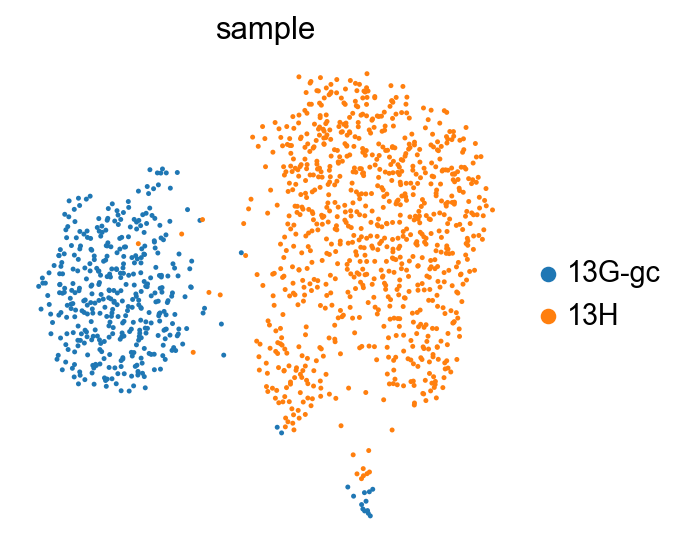

In [11]:
sc.pl.umap(adata, color='sample',size=20, save='_sample.png')

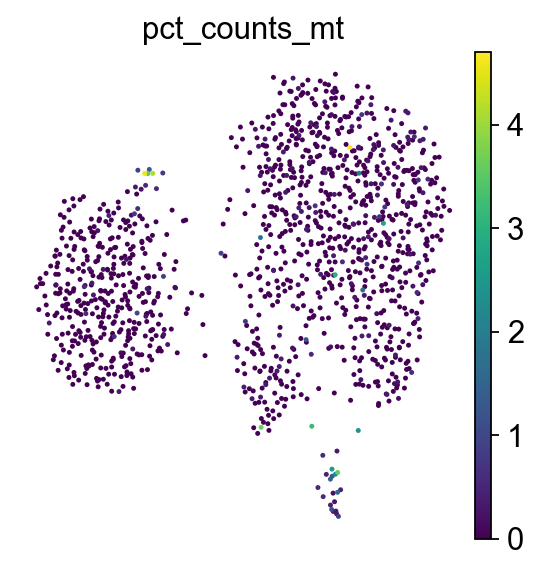

In [12]:
sc.pl.umap(adata, color='pct_counts_mt',size=20, save='_mt.png')

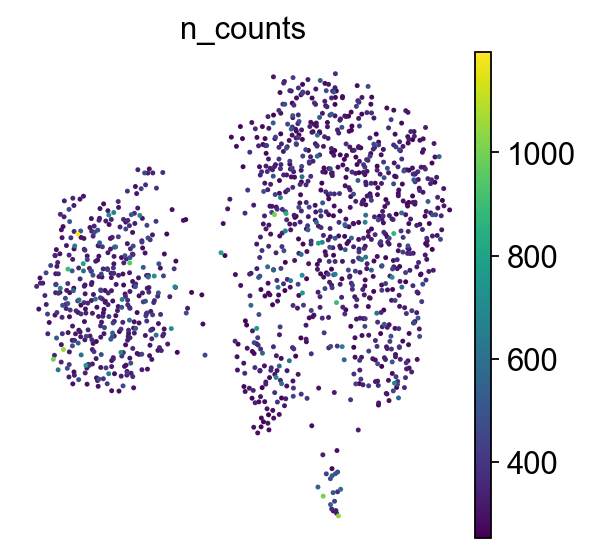

In [13]:
sc.pl.umap(adata, color='n_counts',size=20, save='_counts_per_cell.png')

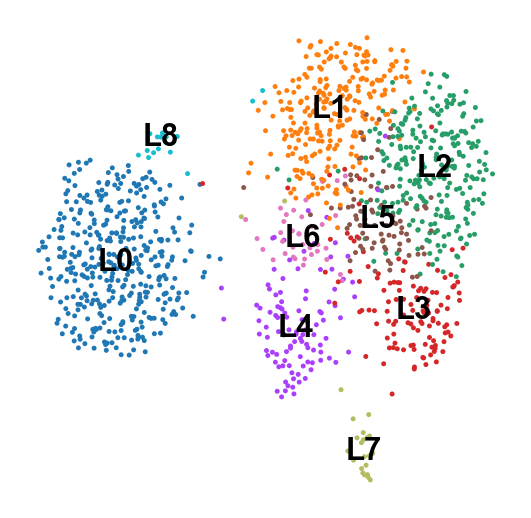

In [14]:
# sc.tl.leiden(adata, resolution=0.5)
sc.tl.leiden(adata, resolution=1)
adata.obs.leiden = 'L'+adata.obs.leiden.astype('str')
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', save='_clusters.png',size=20)

age,P2mo,P10,P14,P18-20mo,P25,P36
leiden,,,,,,
L0,18.518519,3.292181,8.436214,26.234568,17.695473,25.823045
L1,15.460993,13.617021,20.141844,12.624113,18.865248,19.290780
L2,16.271722,11.216430,17.851501,14.060032,14.849921,25.750395
L3,16.965742,11.256117,14.845024,19.902121,15.334421,21.696574
L4,15.046296,10.185185,15.509259,13.888889,22.453704,22.916667
L5,17.902813,9.974425,16.879795,17.902813,15.601023,21.739130
L6,14.772727,11.647727,16.761364,17.045455,19.602273,20.170455
L7,16.510903,12.772586,19.314642,17.757009,14.330218,19.314642
L8,11.721612,23.076923,24.175824,8.058608,19.780220,13.186813


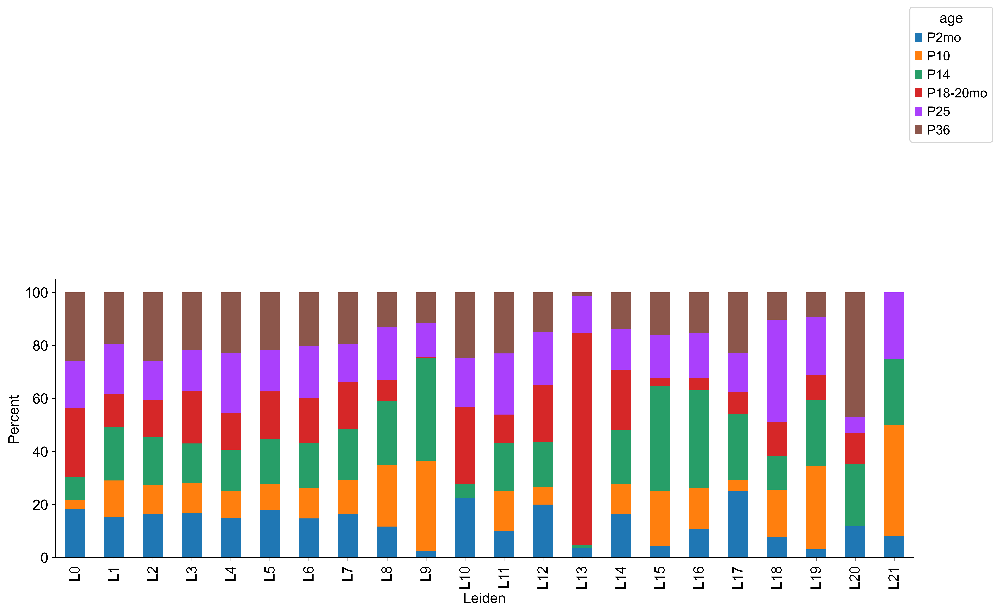

In [13]:
plot_cluster_proportions(adata, bar_key='leiden', color_key='age')

experiment,ont_a,ont_b,pb_a
leiden,,,
L0,0.342717,0.333064,0.324218
L1,0.449248,0.365231,0.185520
L2,0.174286,0.338492,0.487222
L3,0.338781,0.314493,0.346726
L4,0.191104,0.215526,0.593369
L5,0.353836,0.268778,0.377386
L6,0.329266,0.340956,0.329778
L7,0.273260,0.360638,0.366103
L8,0.442814,0.364869,0.192317


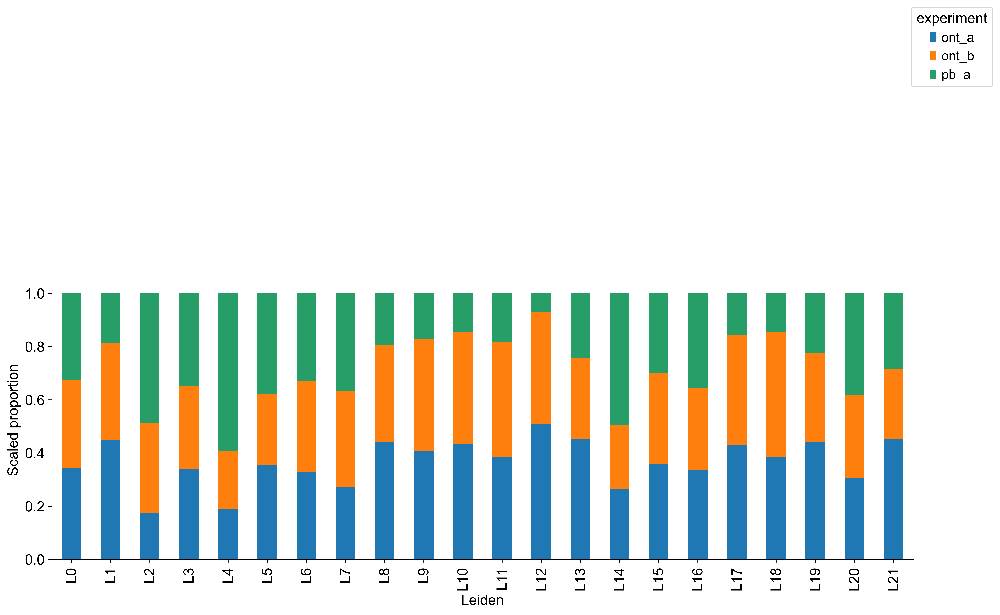

In [14]:
plot_cluster_proportions(adata,
                         bar_key='leiden',
                         color_key='experiment',
                         scale=True,
                         opref='figures/')

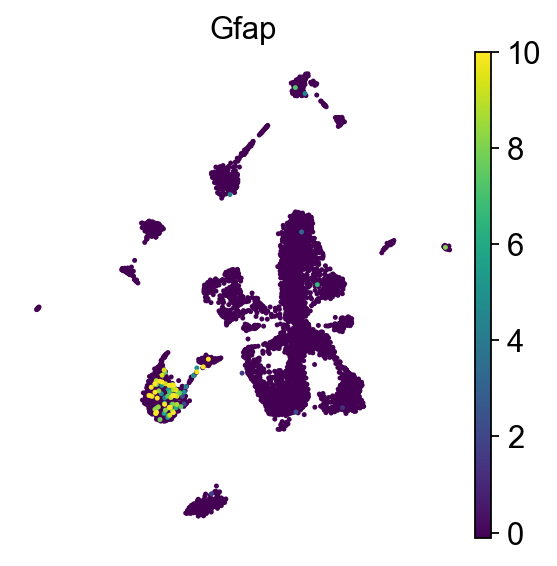

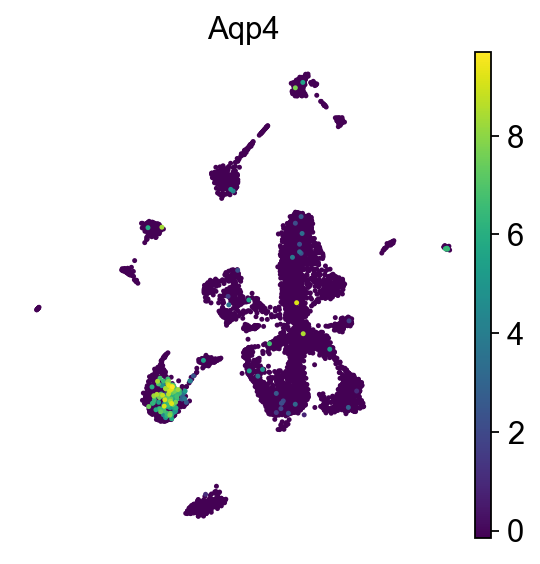

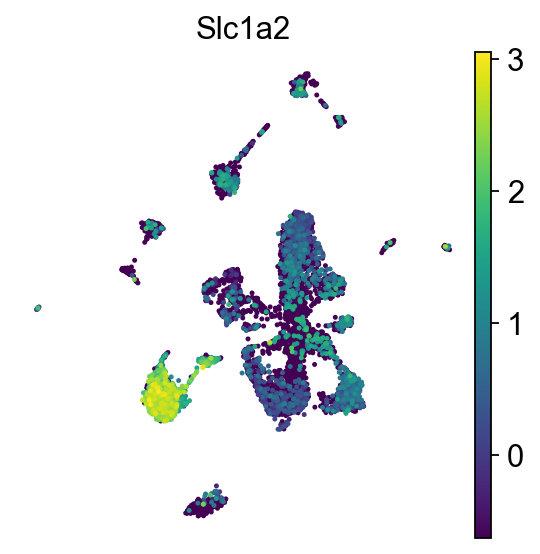

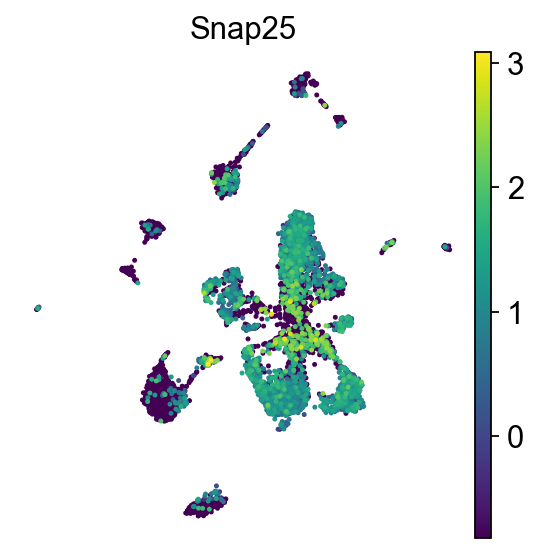

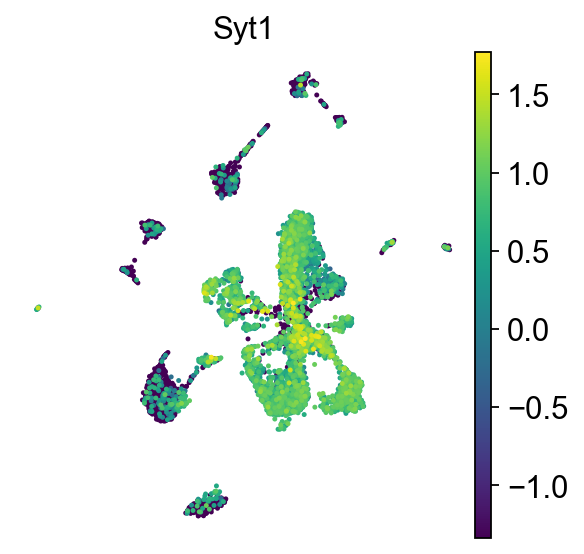

...

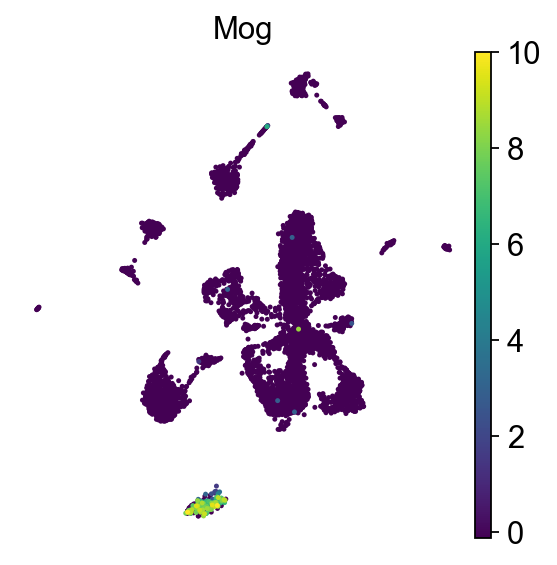

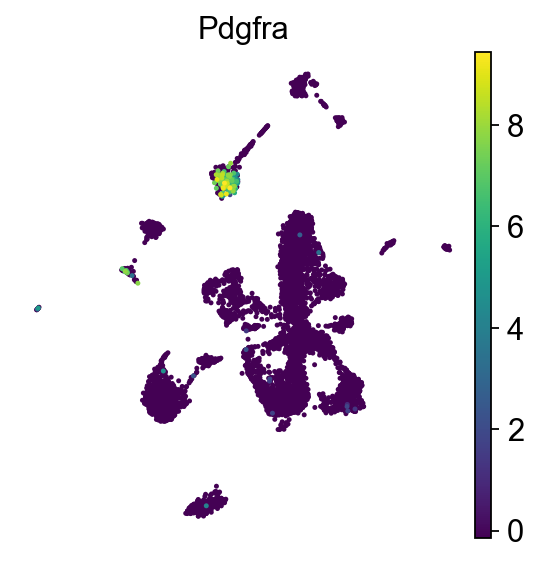

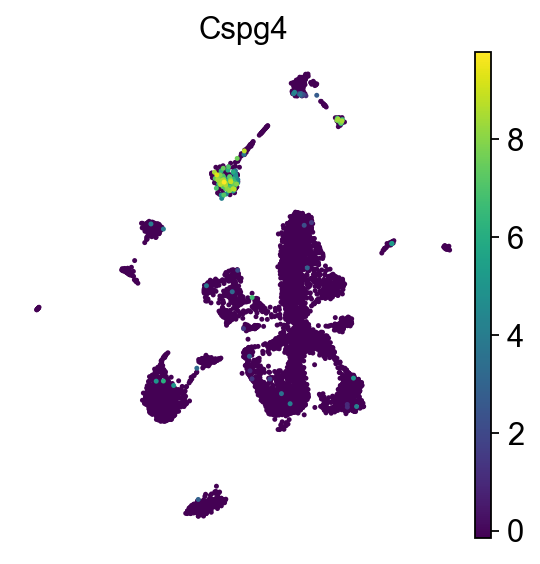

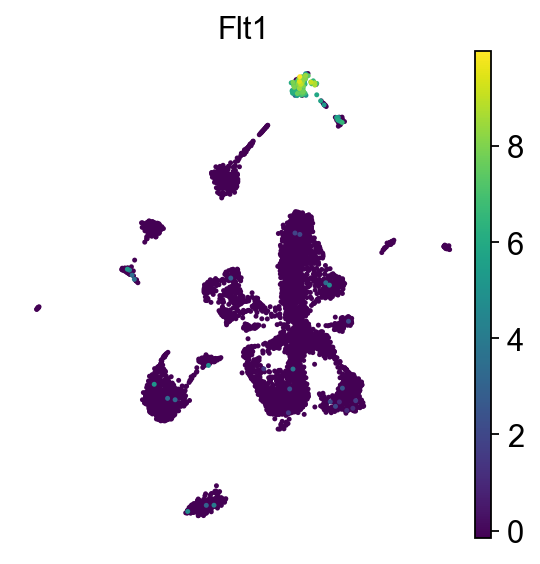

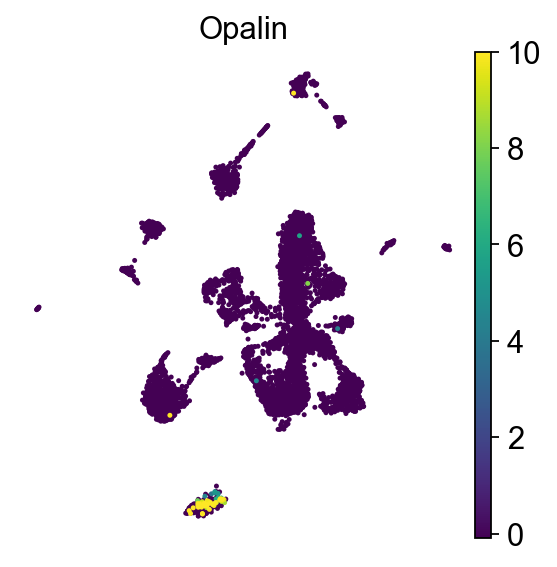

In [15]:
marker_genes = ['Gfap', 'Aqp4', 'Slc1a2', 'Snap25', 'Syt1', 'Slc17a7',
               'Satb2', 'Gad1', 'Gad2', 
                'Spi1', 'Csf1r', 'Clu', 'Apoe','Tgfbr1', 'Cd74', 'P2ry12', 'Mobp',
               'Mbp', 'Mog', 'Pdgfra', 'Cspg4', 'Flt1', 'Opalin']
for gene in marker_genes:
    if gene in adata.var.index.tolist():
        sc.pl.umap(adata, color=gene, size=20, save='_{}.png'.format(gene))

/Users/fairliereese/miniconda3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/fairliereese/miniconda3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/fairliereese/miniconda3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: 

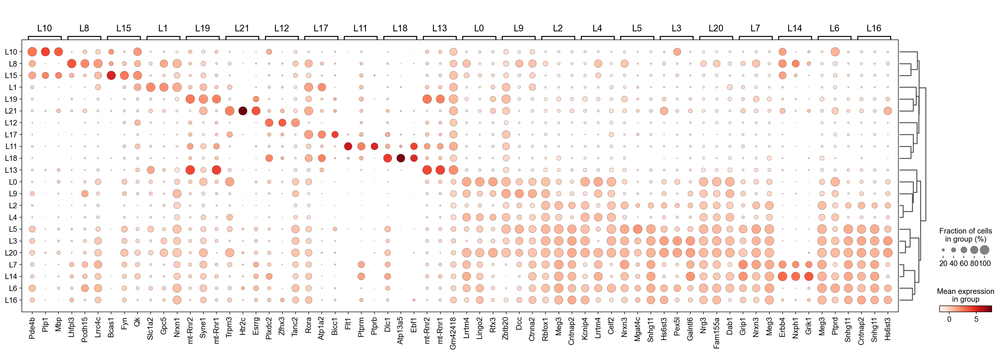

In [16]:
sc.tl.rank_genes_groups(adata, groupby='leiden', 
                        layer='log_norm', use_raw=False)
sc.pl.rank_genes_groups_dotplot(adata, n_genes=3,
                                save='marker_leiden.png')

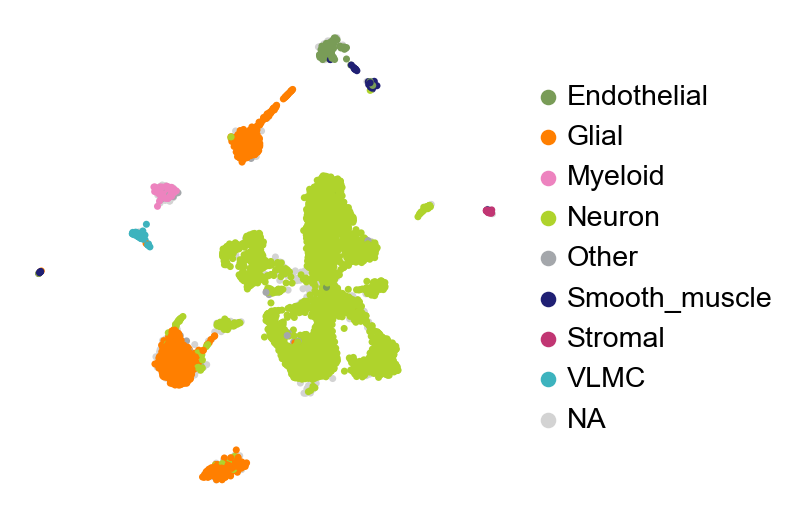

In [4]:
sc.pl.umap(adata, color='sr_gen_celltype', title='', save='_sr_gen_celltype.png', size=40)

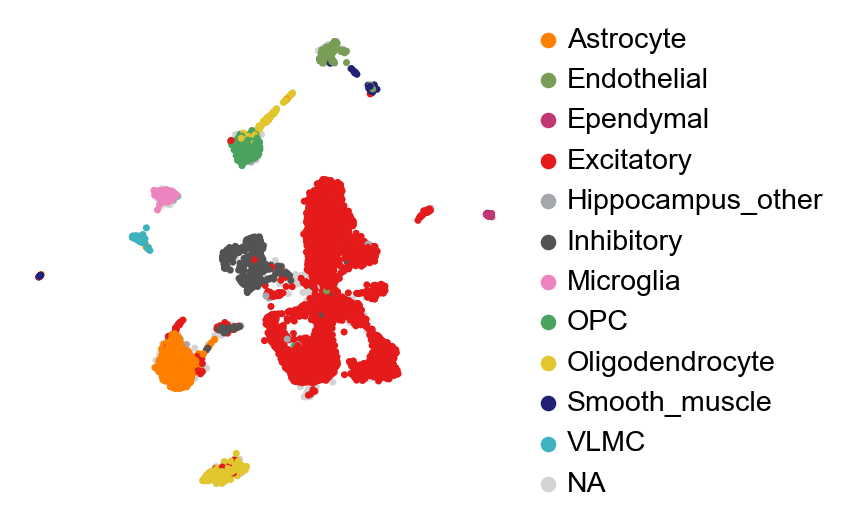

In [5]:
sc.pl.umap(adata, color='sr_celltype', title='', save='_sr_celltype.png', size=40)

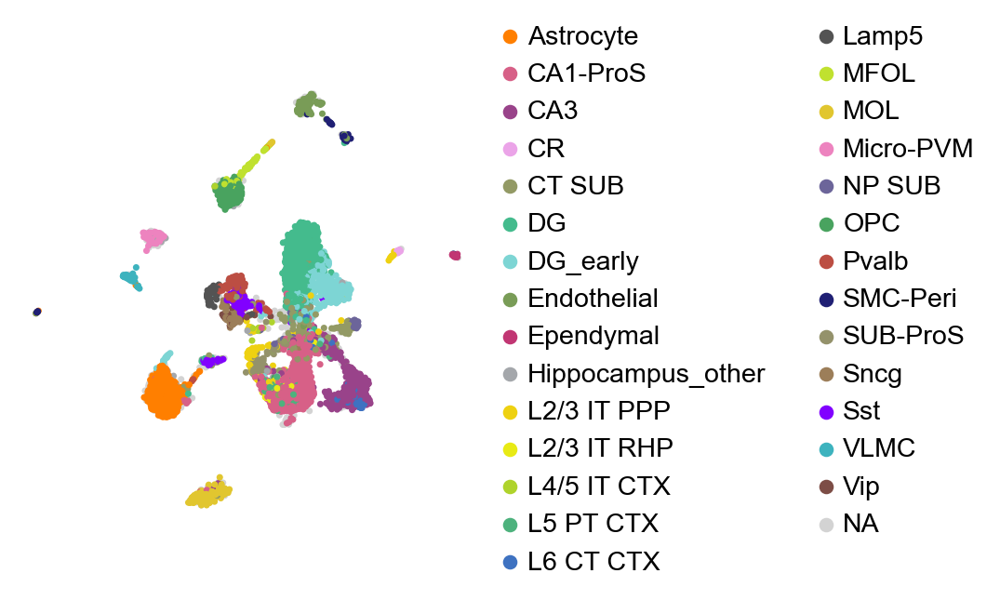

In [6]:
sc.pl.umap(adata, color='sr_sub_celltype', title='', save='_sr_sub_celltype.png', size=40)

In [20]:
adata, temp = add_obs_counts_col(adata, 'sr_sub_celltype')
adata, temp = add_obs_counts_col(adata, 'sr_celltype')
adata, temp = add_obs_counts_col(adata, 'sr_gen_celltype')

/Users/fairliereese/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


/Users/fairliereese/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'sr_sub_celltype_counts_str' as categorical
/Users/fairliereese/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'sr_celltype_counts_str' as categorical
/Users/fairliereese/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated 

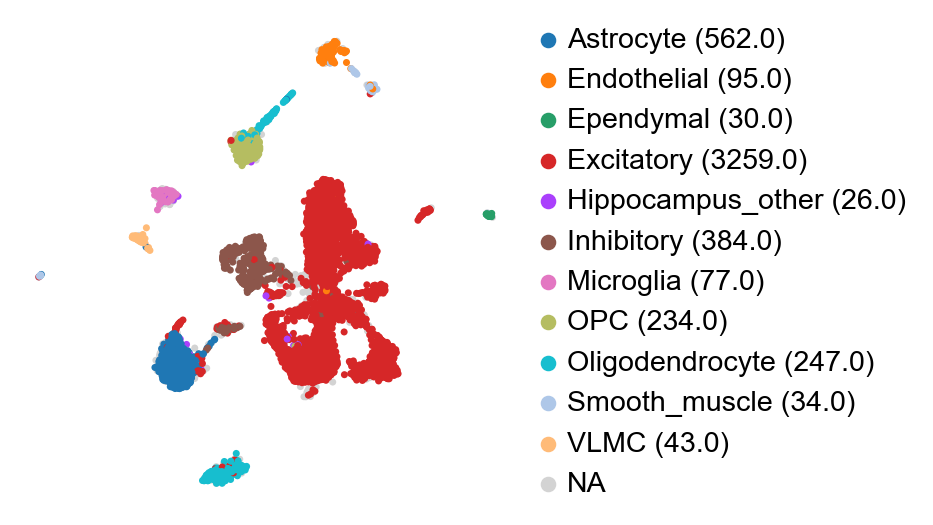

In [23]:
sc.pl.umap(adata, color='sr_celltype_counts_str', title='', save='_sr_celltype_counts.png', size=40)

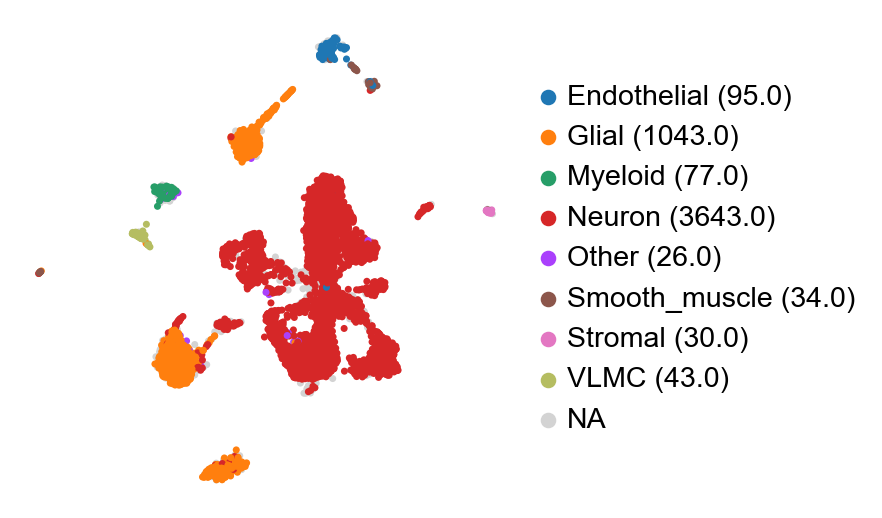

In [25]:
sc.pl.umap(adata, color='sr_gen_celltype_counts_str', title='', save='_sr_gen_celltype_counts.png', size=40)

{'L0': 'Excitatory', 'L1': 'Astrocyte', 'L2': 'Excitatory', 'L3': 'Excitatory', 'L4': 'Excitatory', 'L5': 'Excitatory', 'L6': 'Excitatory', 'L7': 'Inhibitory', 'L8': 'OPC', 'L9': 'Excitatory', 'L10': 'Oligodendrocyte', 'L11': 'Endothelial', 'L12': 'Microglia', 'L13': 'Inhibitory', 'L14': 'Inhibitory', 'L15': 'Oligodendrocyte', 'L16': 'Excitatory', 'L17': 'VLMC', 'L18': 'Smooth_muscle', 'L19': 'Ependymal', 'L20': 'Excitatory', 'L21': 'Smooth_muscle'}


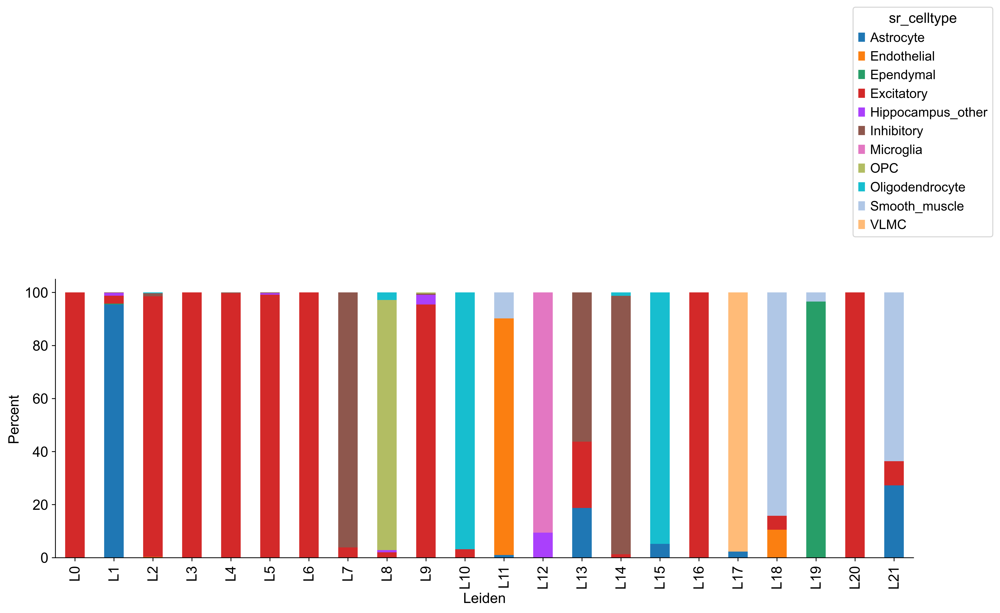

In [26]:
# proportions of sr-annotated celltypes per LR cluster
props = plot_cluster_proportions(adata,
                                bar_key='leiden',
                                color_key='sr_celltype',
                                opref='figures/lr_cluster_by_sr_celltype')
m = props.idxmax(axis=1).to_frame().to_dict()[0]
print(m)
adata.obs['lr_celltype'] = adata.obs.leiden.map(m)

{'L0': 'Neuron', 'L1': 'Glial', 'L2': 'Neuron', 'L3': 'Neuron', 'L4': 'Neuron', 'L5': 'Neuron', 'L6': 'Neuron', 'L7': 'Neuron', 'L8': 'Glial', 'L9': 'Neuron', 'L10': 'Glial', 'L11': 'Endothelial', 'L12': 'Myeloid', 'L13': 'Neuron', 'L14': 'Neuron', 'L15': 'Glial', 'L16': 'Neuron', 'L17': 'VLMC', 'L18': 'Smooth_muscle', 'L19': 'Stromal', 'L20': 'Neuron', 'L21': 'Smooth_muscle'}


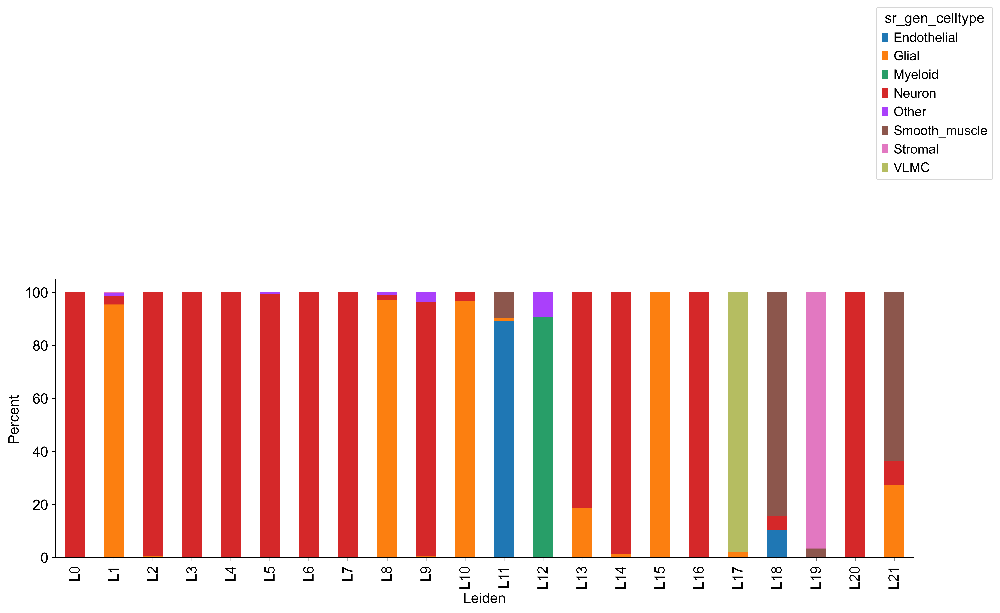

In [27]:
# proportions of sr-annotated celltypes per LR cluster
props = plot_cluster_proportions(adata,
                                bar_key='leiden',
                                color_key='sr_gen_celltype',
                                opref='figures/lr_cluster_by_sr_gen_celltype')
m = props.idxmax(axis=1).to_frame().to_dict()[0]
print(m)
adata.obs['lr_gen_celltype'] = adata.obs.leiden.map(m)

{'L0': 'DG', 'L1': 'Astrocyte', 'L2': 'CA1-ProS', 'L3': 'CA1-ProS', 'L4': 'DG', 'L5': 'CA3', 'L6': 'SUB-ProS', 'L7': 'Sst', 'L8': 'OPC', 'L9': 'DG_early', 'L10': 'MOL', 'L11': 'Endothelial', 'L12': 'Micro-PVM', 'L13': 'Sst', 'L14': 'Lamp5', 'L15': 'MFOL', 'L16': 'CR', 'L17': 'VLMC', 'L18': 'SMC-Peri', 'L19': 'Ependymal', 'L20': 'CA1-ProS', 'L21': 'SMC-Peri'}


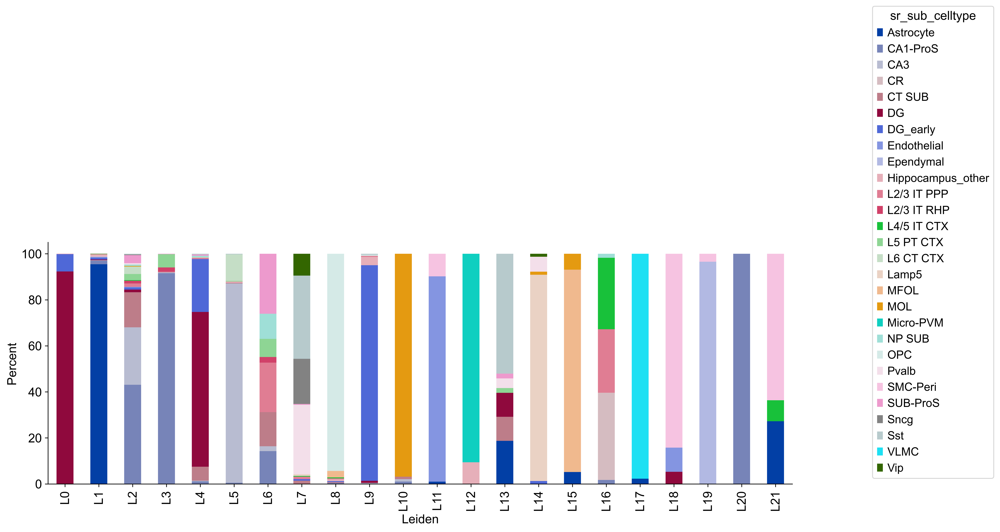

In [28]:
# proportions of sr-annotated celltypes per LR cluster
props = plot_cluster_proportions(adata,
                                bar_key='leiden',
                                color_key='sr_sub_celltype',
                                opref='figures/lr_cluster_by_sr_sub_celltype')
m = props.idxmax(axis=1).to_frame().to_dict()[0]
print(m)
adata.obs['lr_sub_celltype'] = adata.obs.leiden.map(m)

/Users/fairliereese/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'lr_celltype' as categorical
/Users/fairliereese/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'lr_gen_celltype' as categorical
/Users/fairliereese/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in

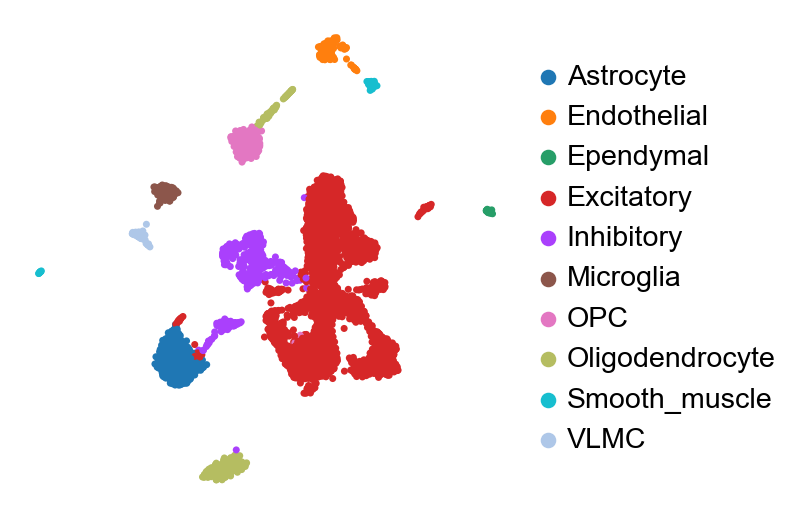

In [29]:
sc.pl.umap(adata, color='lr_celltype', title='', save='_lr_celltype.png', size=40)

In [4]:
adata = sc.read('gene_processed.h5ad')

In [5]:
# set colors
for c in ['celltype', 'sub_celltype']:
    c2 = 'lr_{}'.format(c)
    c_dict = get_celltype_colors('hippocampus', c)
    set_metadata_colors(adata, c2, c_dict)

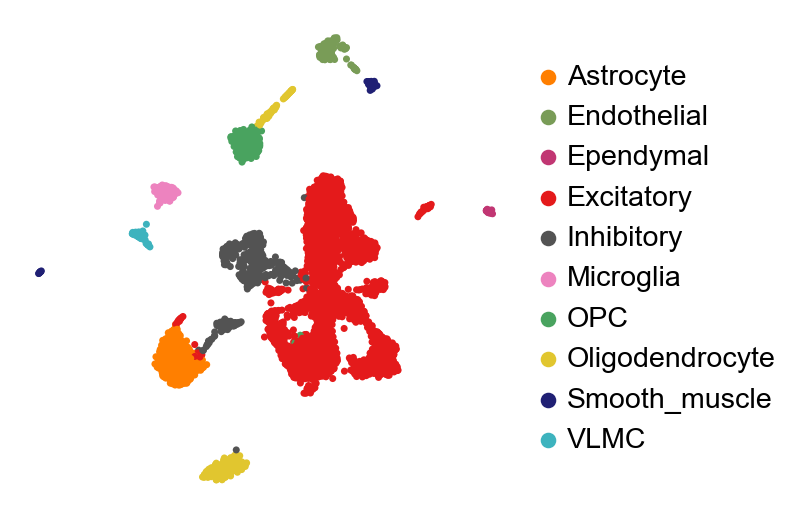

In [10]:
sc.pl.umap(adata, color='lr_celltype', title='', save='_lr_celltype.png', size=40)


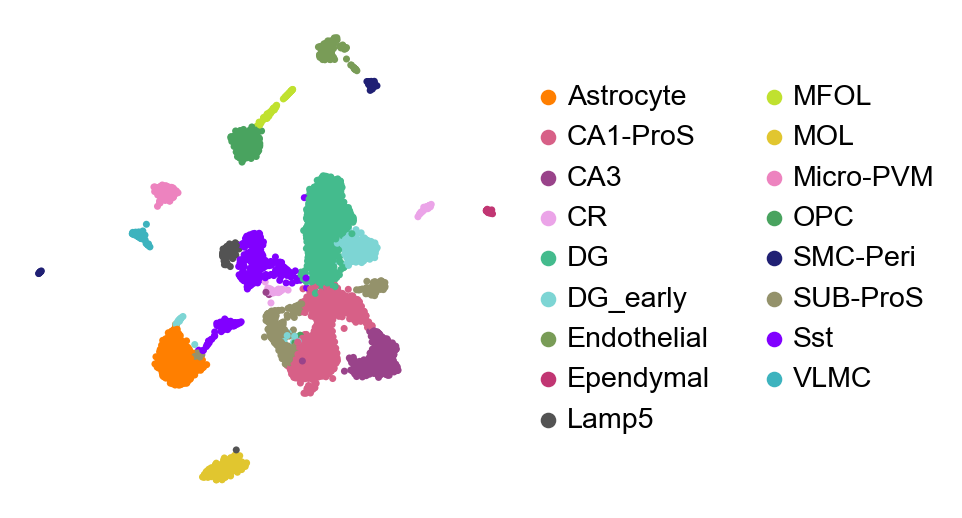

,bc
lr_sub_celltype,
Astrocyte,705
CA1-ProS,1263
CA3,391
CR,65
DG,1404
DG_early,235
Endothelial,139
Ependymal,32
Lamp5,79


In [9]:
sc.pl.umap(adata, color='lr_sub_celltype', title='', save='_lr_sub_celltype.png', size=40)
adata.obs[['bc', 'lr_sub_celltype']].groupby('lr_sub_celltype').count()

In [7]:
# write celltypes, cluster info, and umap coords to a file
write_lr_sc_gene_metadata(adata)

In [33]:
write_bc_leiden(adata, 'gene')

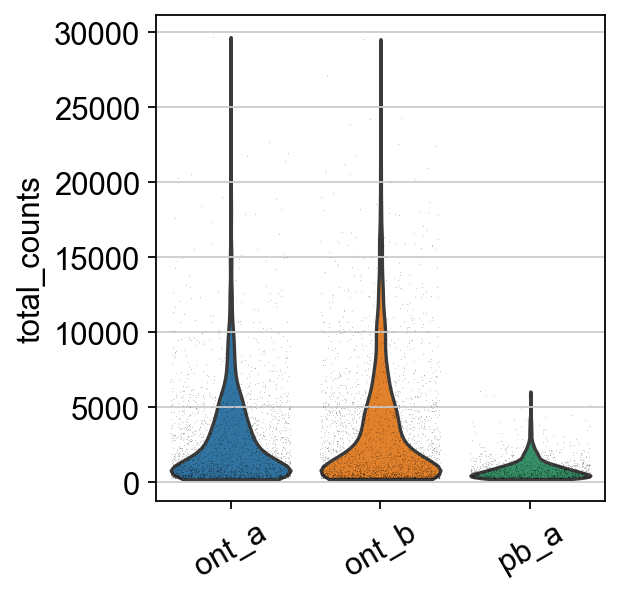

In [49]:
sc.pl.violin(adata, 'total_counts', groupby='experiment', size=0.25, jitter=0.4, rotation=30, save='_pct_counts_mt_per_clust.png')

In [50]:
# calculate median and mean umi count / nuc for each library
temp1 = adata.obs[['experiment', 'total_counts']].groupby('experiment').median().reset_index()
temp1.rename({'total_counts': 'median_umi'}, axis=1, inplace=True)

temp2 = adata.obs[['experiment', 'total_counts']].groupby('experiment').mean().reset_index()
temp2.rename({'total_counts': 'mean_umi'}, axis=1, inplace=True)

temp = temp1.merge(temp2, on='experiment')
temp
# for p in adata.obs.experiment.unique().tolist():
#     med = adata.obs.loc[adata.obs.experiment==p, 'total_counts'].median()
#     mean = adata.obs.loc[adata.obs.experiment==p, 'total_counts'].mean()
    
#     print('{} median UMI / cell: {}'.format(p, med))
#     print('{} mean UMI / cell: {}'.format(p, mean))    
#     print()

,experiment,median_umi,mean_umi
0,ont_a,1572.0,2729.089844
1,ont_b,1604.0,3216.415527
2,pb_a,667.0,869.397278


In [51]:
adata = sc.read('gene_processed.h5ad')

In [52]:
# how many reads / cell do we get for the matched cells in ONT A and PB A?
a_libs = ['ont_a', 'pb_a']
temp = adata.obs.loc[adata.obs.experiment.isin(a_libs)]
temp = temp[['bc', 'experiment', 'total_counts']].reset_index(drop=True)
temp = temp.pivot(index='bc', columns='experiment', values='total_counts')
temp.head()

experiment,ont_a,pb_a
bc,,
AAACATCGAACCGAGAATTCATGG,2610.0,333.0
AAACATCGAACGTGATACTATATA,479.0,NaN
AAACATCGACATTGGCTCACTTTA,476.0,NaN
AAACATCGACCTCCAAATCGCATA,230.0,NaN
AAACATCGATTGGCTCTGGCGCGC,1109.0,NaN


In [34]:
# sns.set_context('paper', font_scale=2)

# ax = sns.jointplot(data=temp, x='ont_a', y='pb_a',
#                    joint_kws={'data':temp, 's':40, 'alpha':1})
# #                    xlim=(0,20000), ylim=(0,200000), 
# #                    hue='experiment')
# ax = ax.ax_joint 

# # ax.legend(title='')
# ax.spines['right'].set_visible(False)
# ax.spines['top'].set_visible(False)
# # ax.get_legend().remove()


In [36]:
def plot_matching_cells(adata, temp, i):
    
    bc = temp.iloc[i].name
    print(bc)
    
    adata.obs['matching_cells'] = np.nan
    adata.obs.loc[(adata.obs.bc == bc)&(adata.obs.experiment == 'pb_a'), 'matching_cells'] = 'pb'
    adata.obs.loc[(adata.obs.bc == bc)&(adata.obs.experiment == 'ont_a'), 'matching_cells'] = 'ont'
    
    sc.pl.umap(adata, color='matching_cells', size=120, alpha=1)     

... storing 'matching_cells' as categorical


CAGATCTGTAGGATGACTGTCCCG


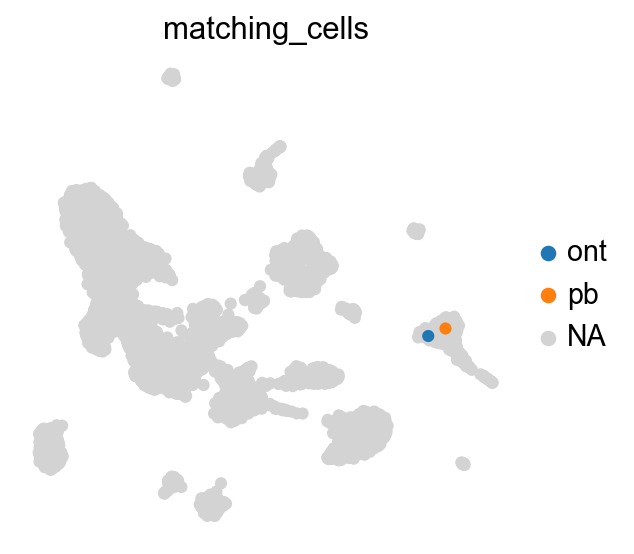

In [37]:
plot_matching_cells(adata, temp, 1040)

In [92]:
# how close are the corresponding pairs of pb and ont a cells?
# how does this compare to what all of the distances look like? 
temp.dropna(inplace=True)
ont_pb_a_dists = []
adata.obs['order_index'] = [i for i in range(len(adata.obs))]

for bc in temp.index.tolist():
    pb_ind = adata.obs.loc[(adata.obs.bc == bc)&(adata.obs.experiment == 'pb_a'), 'order_index'].values[0]
    ont_ind = adata.obs.loc[(adata.obs.bc == bc)&(adata.obs.experiment == 'ont_a'), 'order_index'].values[0]
#     dist1 = adata.obsp['distances'][pb_ind, ont_ind]
#     dist2 = adata.obsp['distances'][ont_ind, pb_ind]
    
    dist1 = adata.obsp['connectivities'][pb_ind, ont_ind]
    dist2 = adata.obsp['connectivities'][ont_ind, pb_ind]
    
    if dist1 != dist2:
        print('warning')
    ont_pb_a_dists.append(dist1)

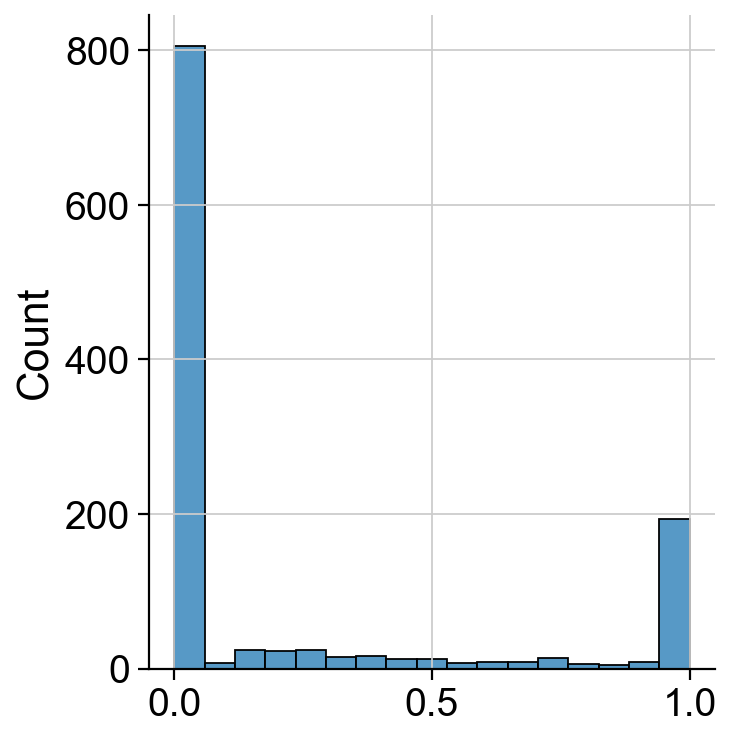

In [93]:
ax = sns.displot(data=ont_pb_a_dists)

In [94]:
# random sample of the distances
i = np.random.choice(len(adata.obs.index), 2000)
j = np.random.choice(len(adata.obs.index), 2000)
print(len(i))
coords = [(i, j) for i, j in zip(i,j) if i != j]
print(len(coords))
dists = []
for coord in coords:
#     dists.append(adata.obsp['distances'][coord[0], coord[1]])
    dists.append(adata.obsp['connectivities'][coord[0], coord[1]])
    
        

2000
2000


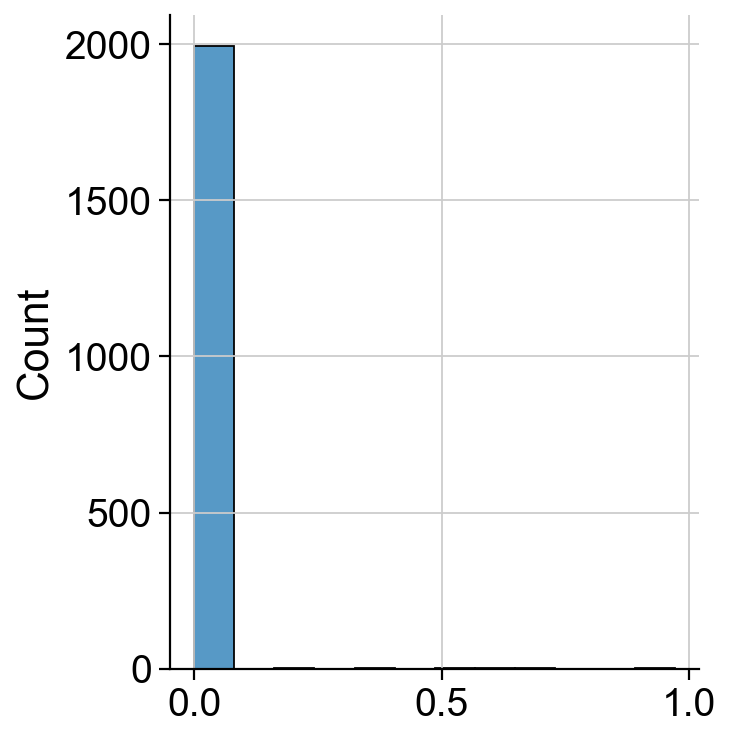

In [95]:
ax = sns.displot(data=dists)

# Just ONT data

In [96]:
adata = sc.read('gene_raw.h5ad')

# limit to ONT data
exps = ['ont_a', 'ont_b']
inds = adata.obs.loc[adata.obs.experiment.isin(exps)].index
adata = adata[inds, :]

sc.pp.filter_cells(adata, min_genes=0)
print(len(adata.obs.index))
sc.pp.filter_cells(adata, min_counts=500)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.layers['log_norm'] = adata.X.copy()
sc.pp.highly_variable_genes(adata, n_top_genes=4000)
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')

# correct for batch effects from and 'experiment'
# sc.external.pp.harmony_integrate(adata, key=['experiment'])
# sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30,
#     use_rep='X_pca_harmony', metric='cosine')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30,
     metric='cosine')

# sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30, metric='cosine')
sc.tl.umap(adata, min_dist=0.8)

Trying to set attribute `.obs` of view, copying.


4857


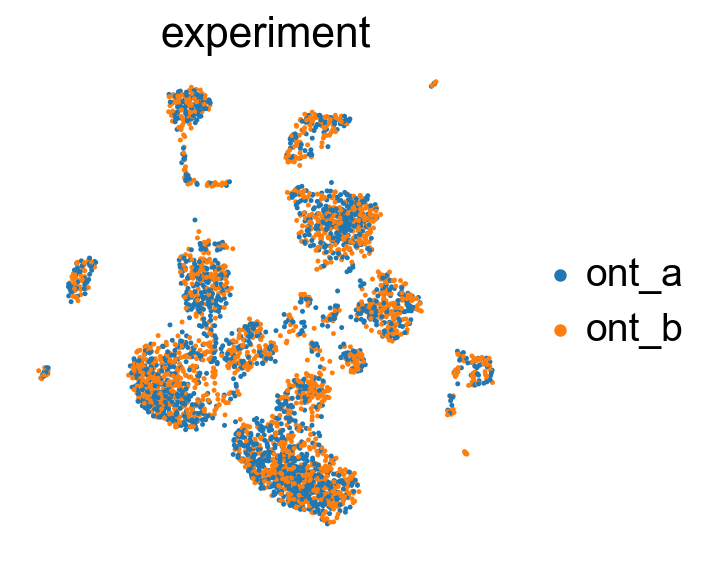

In [97]:
sc.pl.umap(adata, color='experiment', size=20, alpha=1, save='_experiment.png')

... storing 'leiden' as categorical


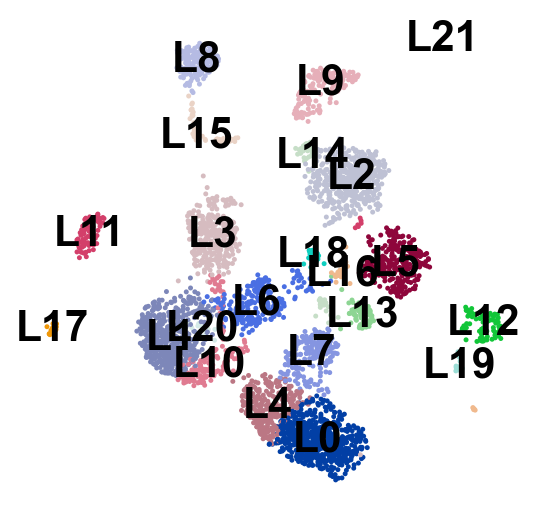

In [98]:
# sc.tl.leiden(adata, resolution=0.5)
sc.tl.leiden(adata, resolution=1)
adata.obs.leiden = 'L'+adata.obs.leiden.astype('str')
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', save='_clusters.png',size=20)

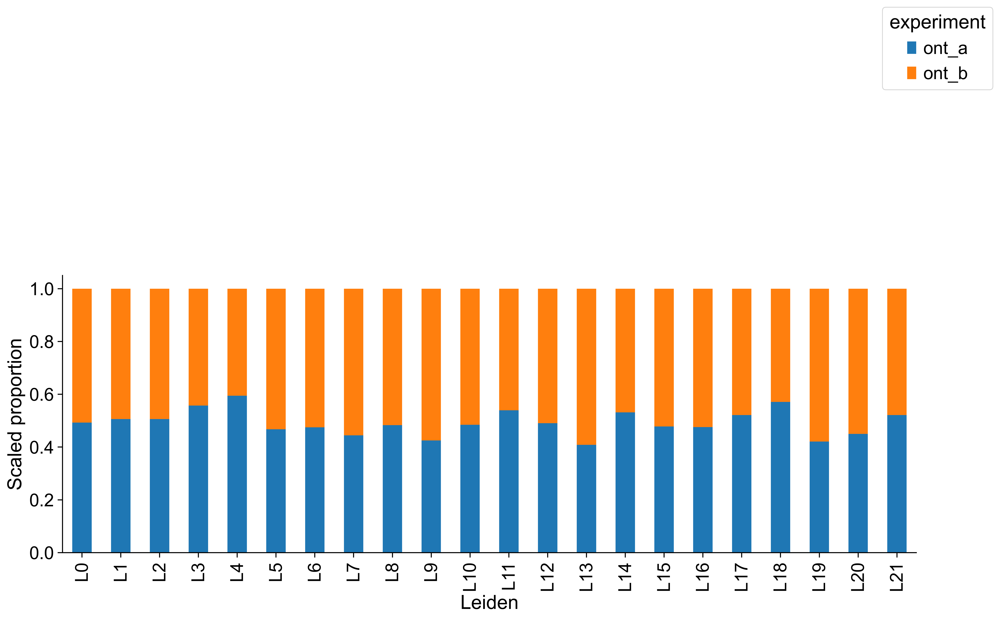

In [99]:
plot_cluster_proportions(adata,
                         bar_key='leiden',
                         color_key='experiment',
                         scale=True,
                         opref='figures/')

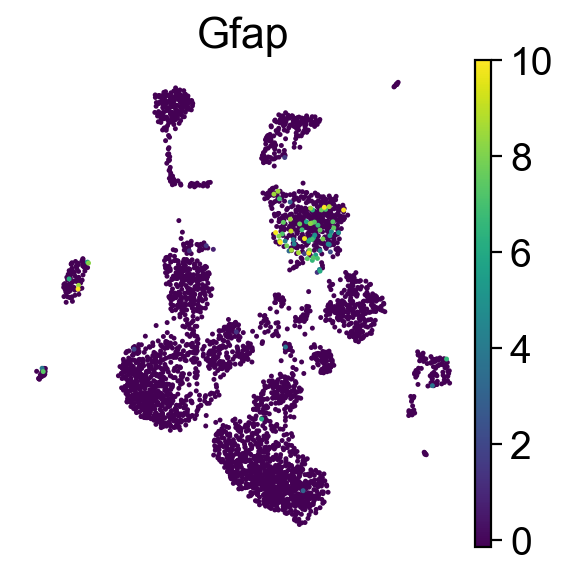

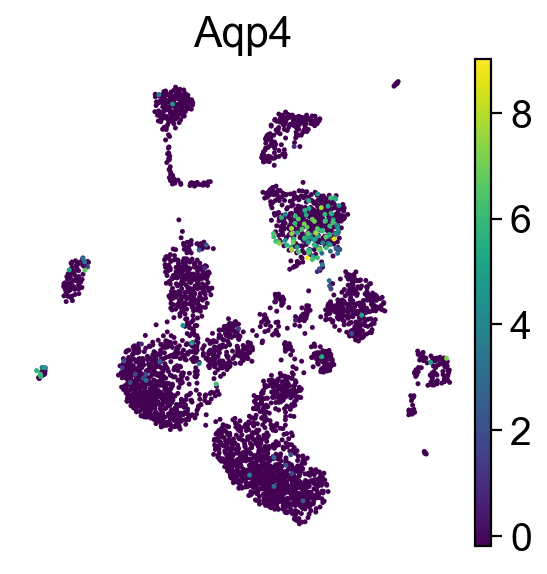

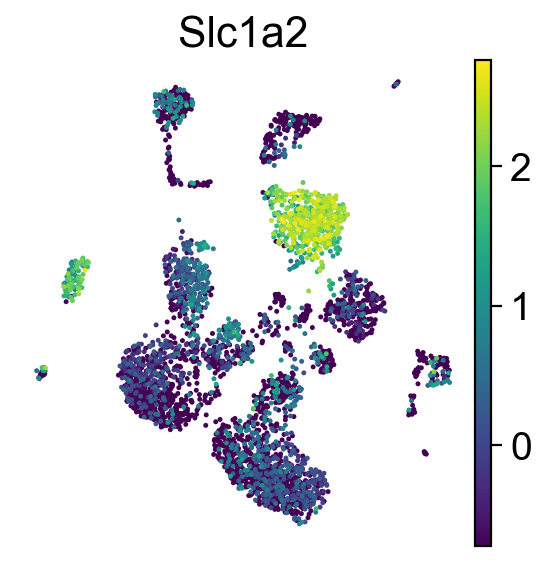

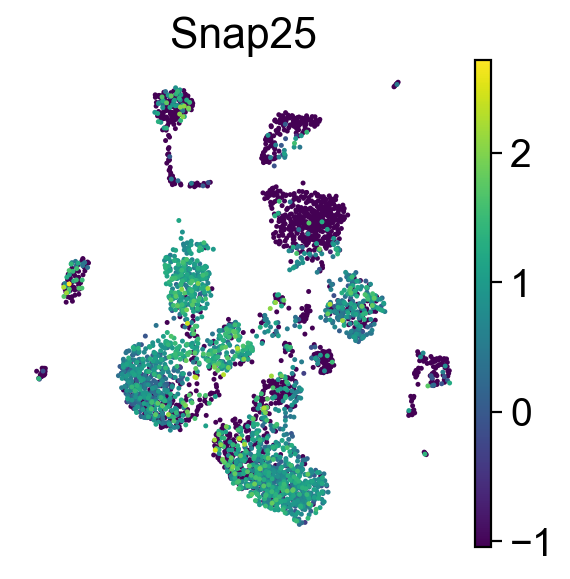

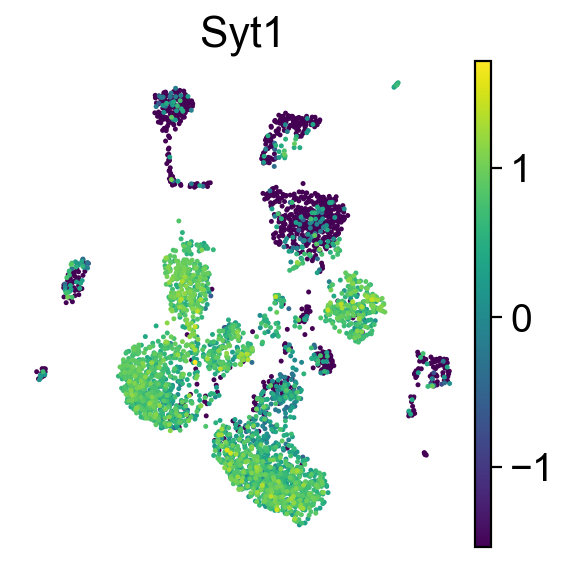

...

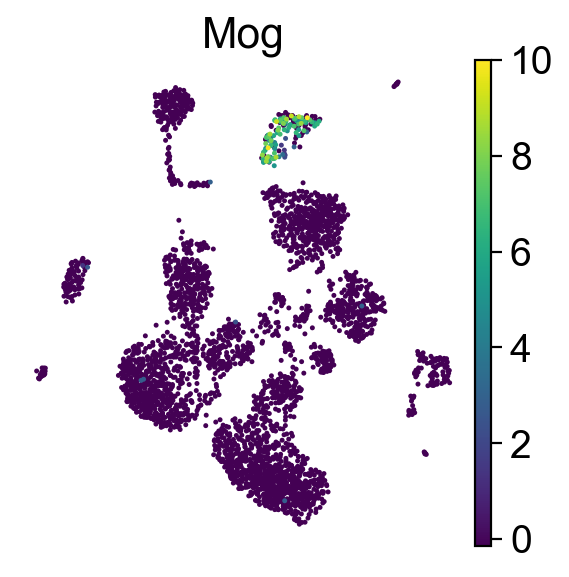

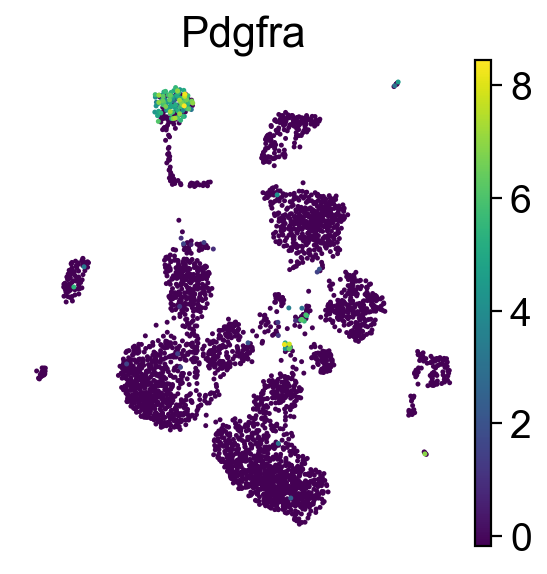

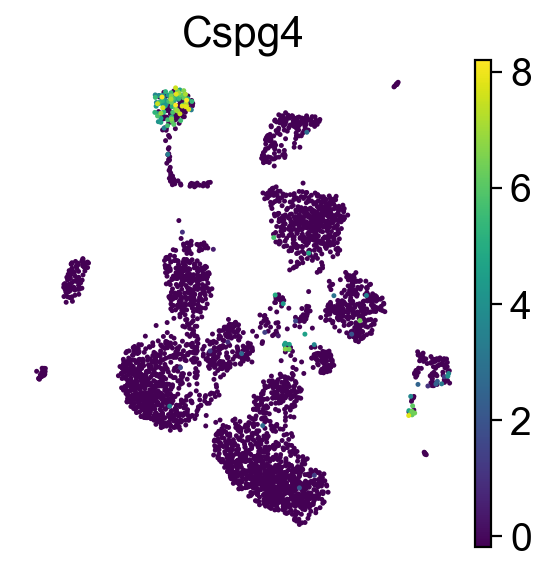

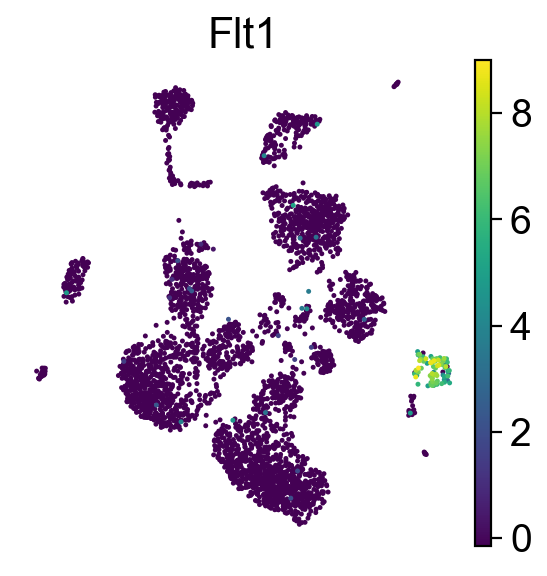

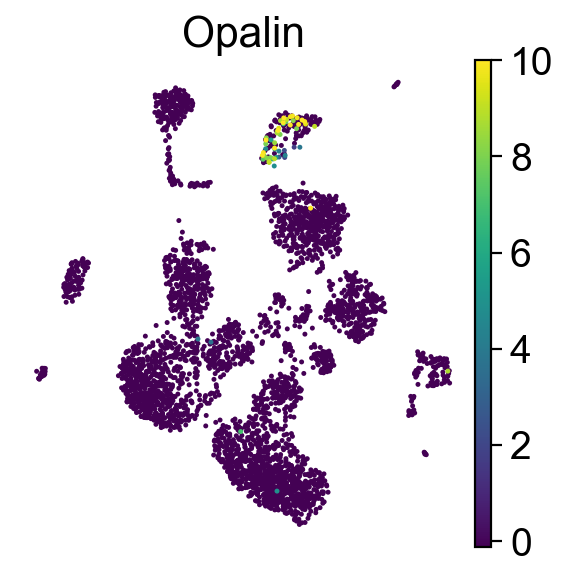

In [100]:
marker_genes = ['Gfap', 'Aqp4', 'Slc1a2', 'Snap25', 'Syt1', 'Slc17a7',
               'Satb2', 'Gad1', 'Gad2', 
                'Spi1', 'Csf1r', 'Clu', 'Apoe','Tgfbr1', 'Cd74', 'P2ry12', 'Mobp',
               'Mbp', 'Mog', 'Pdgfra', 'Cspg4', 'Flt1', 'Opalin']
for gene in marker_genes:
    if gene in adata.var.index.tolist():
        sc.pl.umap(adata, color=gene, size=20, save='_{}.png'.format(gene))